# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [229]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import warnings

In [230]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [231]:
DATA_FILE = "weatherAUS.csv"
data = pd.read_csv(DATA_FILE)

## Análisis Descriptivo

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [232]:
data.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
data.drop("Unnamed: 0", axis=1, inplace=True)

In [233]:
print(data.info())
print("-----------------------------------")
print(data.describe())
print("-----------------------------------")
print(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 15986 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15986 non-null  object 
 1   Location          15986 non-null  object 
 2   MinTemp           15495 non-null  float64
 3   MaxTemp           15500 non-null  float64
 4   Rainfall          15199 non-null  float64
 5   Evaporation       14280 non-null  float64
 6   Sunshine          14038 non-null  float64
 7   WindGustDir       14529 non-null  object 
 8   WindGustSpeed     14531 non-null  float64
 9   WindDir9am        15291 non-null  object 
 10  WindDir3pm        15696 non-null  object 
 11  WindSpeed9am      15725 non-null  float64
 12  WindSpeed3pm      15737 non-null  float64
 13  Humidity9am       15416 non-null  float64
 14  Humidity3pm       15461 non-null  float64
 15  Pressure9am       15251 non-null  float64
 16  Pressure3pm       15260 non-null  float64

## Valores Nulos
Graficamos la dispersion de los valores nulos en un mapa de calor

<Axes: >

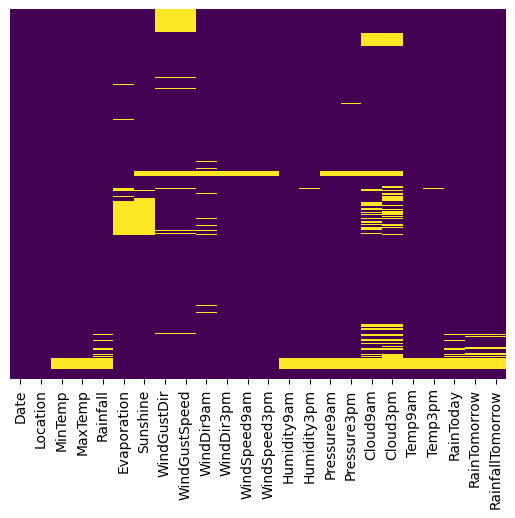

In [234]:
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False)

# Tratamiento de los valores nulos
---
## RainTomorrow, RainToday y RainfallTomorrow

<p> Removeremos las filas que contengan valores nulos para RainToday, RainTomorrow y RainfallTomorrow y la almacenaremos en una variable para utilizarla para predecir sus valores como practica un vez que se tenga el modelo armado con la regresion lineal. </p>

In [235]:
null_rows_for_predictions = data.loc[ data['RainTomorrow'].isnull() | data['RainfallTomorrow'].isnull() | data['Rainfall'].isnull()  ]
data = data [ data['RainTomorrow'].notna() & data["RainfallTomorrow"].notna() & data["RainToday"].notna() ]

## Generar encodings para variable categoricas no numericas
### Encoding de la variable Date
<p> Se intentaron realizar 3 versiones de encoding para la variable date, por semanas, por meses y por estacion </p>
<p> Luego de probar concluimos que el modelo arrojaba valores muy simalares para las 3 formas de codificar la fecha.</p>
<p> Euristicamente concluimos que no hay un impacto significativo en elegir una de las 3 pero se elige la agrupacion por estacion porque al ser solo 4 variables ayuda a explicar el modelo.</p>
<p> Se deja comentado el codigo del encoding para semanas y meses, pero no se utiliza para un mejor entendimiento de los graficos </p>


In [236]:
from datetime import datetime

#data["Week"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').date().isocalendar().week )
#data["Month"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').month)
data["Season"] = data["Date"].apply(lambda time: ( datetime.strptime(time, '%Y-%m-%d').month ) %12 // 3 + 1 )

data.drop("Date", axis=1, inplace=True)

### Generar enconding para el resto de las variables

Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente.
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E. Luego la transformamos a variables dummies al igual que Location. </p>

In [237]:
from sklearn.preprocessing import LabelEncoder

one_hot_encoding=pd.get_dummies(data.Location, dtype=int)
data.drop("Location", axis=1, inplace=True)
data = data.join(one_hot_encoding)

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    data.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(data.WindGustDir, dtype=int, prefix="WindGustDir_")
data.drop("WindGustDir", axis=1, inplace=True)
data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir9am, dtype=int,  prefix="WindDir9am_")
data.drop("WindDir9am", axis=1, inplace=True)
data = data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
data.drop("WindDir3pm", axis=1, inplace=True)
data = data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Month, dtype=int, prefix="Month_")
# data.drop("Month", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.Season, dtype=int, prefix="Season_")
data.drop("Season", axis=1, inplace=True)
data= data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Week, dtype=int, prefix="Week_")
# data.drop("Week", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

le = LabelEncoder()
data["RainToday"] = le.fit_transform(data.RainToday)
data["RainTomorrow"] = le.fit_transform(data.RainTomorrow)

full_data_encoded = data.copy() # esta variable se utilizara mas adelante para calcular una regresion sobre los datos sin interpolar

## Graficar y entendier la distribucion de las variables

Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos.

### Interpolar utilizando method='linear'

Considerando que los datos están organizados de manera cronológica y representan valores recolectados cronologicamente para fechas consecutivas, estas no deberian variar demasiado, asi que aplicamos la función de interpolación utilizando el parámetro 'linear' para completar los valores faltantes con datos similares.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' es más efectiva que, por ejemplo, el uso del 'promedio' para rellenar valores nulos en todas las variables a excepción de Cloud9am, Cloud3pm, Evaporation y Sunshine.

In [238]:
def plot_interpolated_scatter(cols: list, pd_data: pd.DataFrame, method: str, order:any = None, sx :int = None, sy:int = None, fsize : tuple=(12,12)):

    sx = int(len(cols)/2) + int(len(cols)%2) if not sx else sx 
    sy = 2 if not sy else sy 

    f, axs = plt.subplots(sx,sy, figsize=fsize, squeeze=False)
    
    i = 0
    for x in range(0, sx):
        for y in range(0,sy):
            if i > len(cols)-1:
                break
            col = cols[i]
            data_to_plot = pd_data[[col]].copy()
            data_to_plot.loc[:, "is_nan"] = data_to_plot[col].isnull()
            data_to_plot.interpolate(method=method,order=order, inplace=True)
            sbn.scatterplot(data=data_to_plot, x=range(0, data_to_plot.shape[0] ), y=col, hue="is_nan", ax=axs[x][y])
            i+=1
    plt.show()    

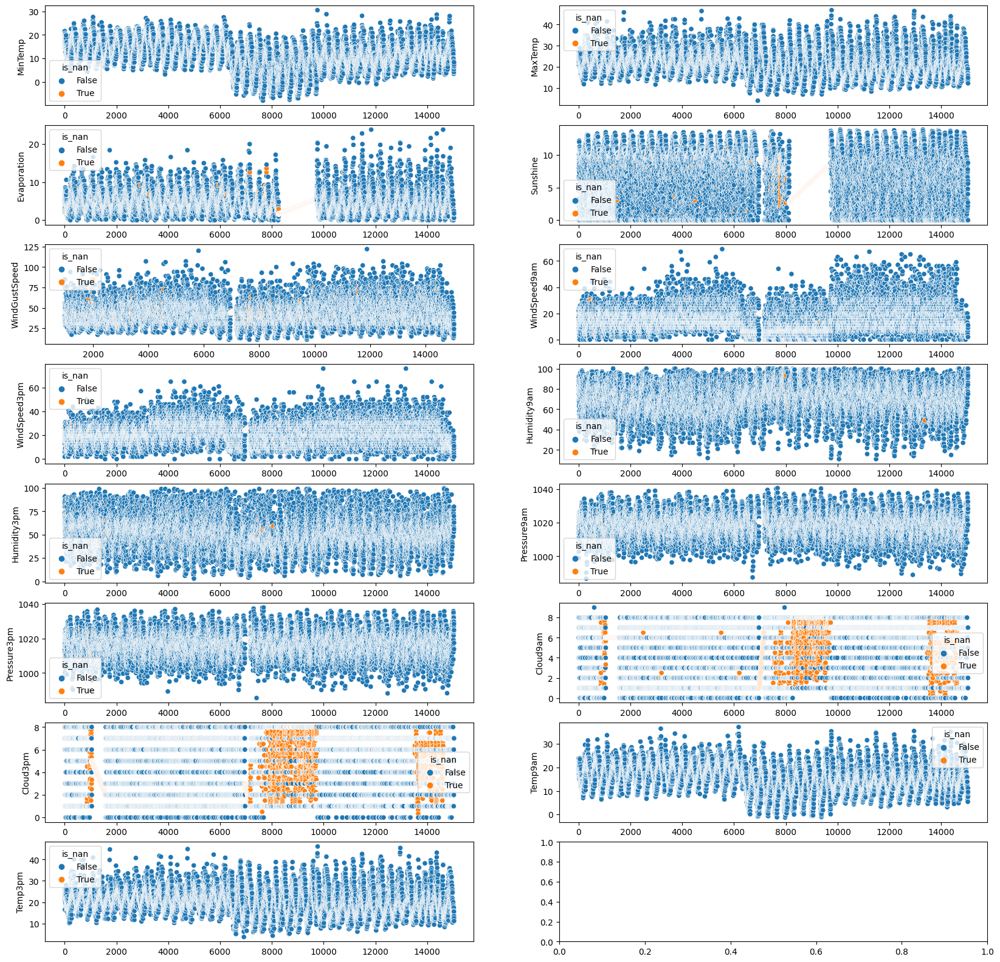

In [239]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

plot_interpolated_scatter(cols, data, "linear", fsize=(20,20))

### Interpolar utilizando method='nearest'
<p> Al intentar interpolar el resto de las variables utilizando nearest vemos que el resultado no es bueno para Evaporation y Sunshine por la gran cantidad de datos consecutivos faltantes en ambas. </p>
<p> Se nota una mejora en el caso de Cloud9am y Cloud3pm el cual puede ser considerado posteriormente si no se encuentra una forma mas optima de interpolar los valores nulos de estas variables.</p>

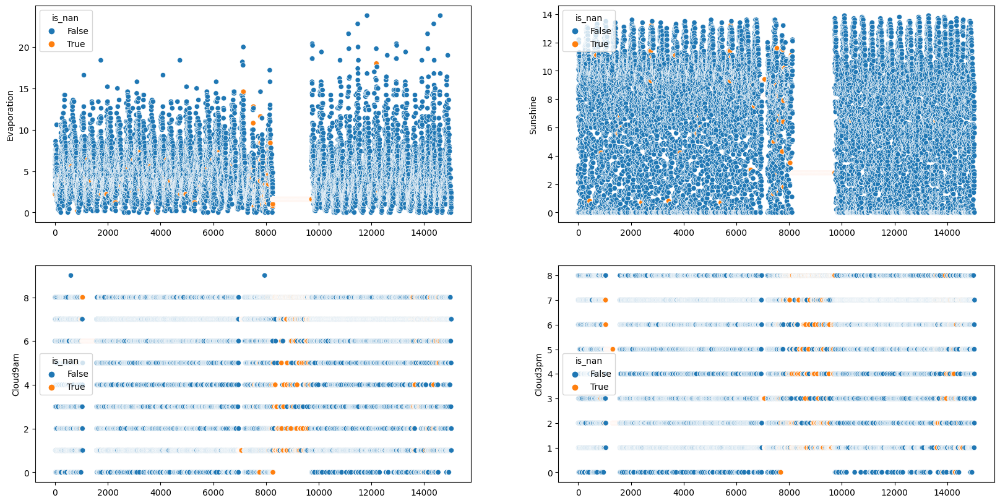

In [240]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]

plot_interpolated_scatter(cols, data, "nearest", fsize=(20,10))

### Interpolar utilizando method='cubicspline'
Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. 
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

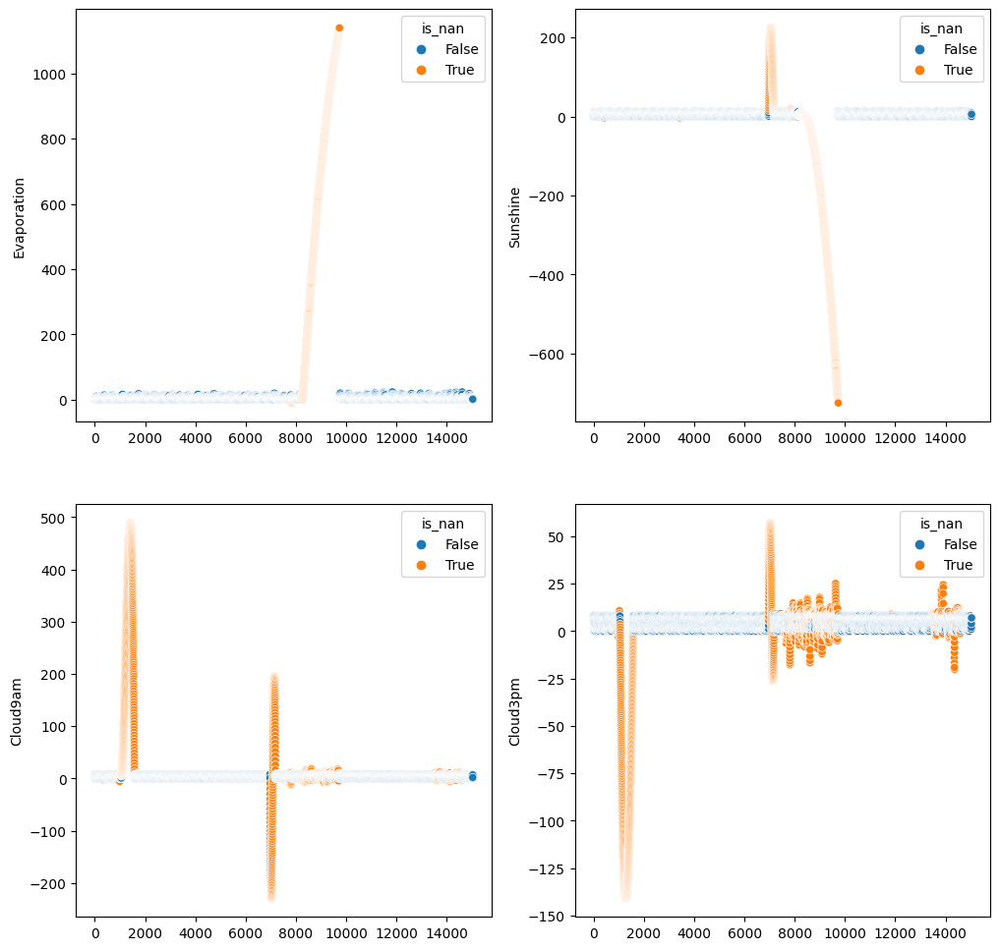

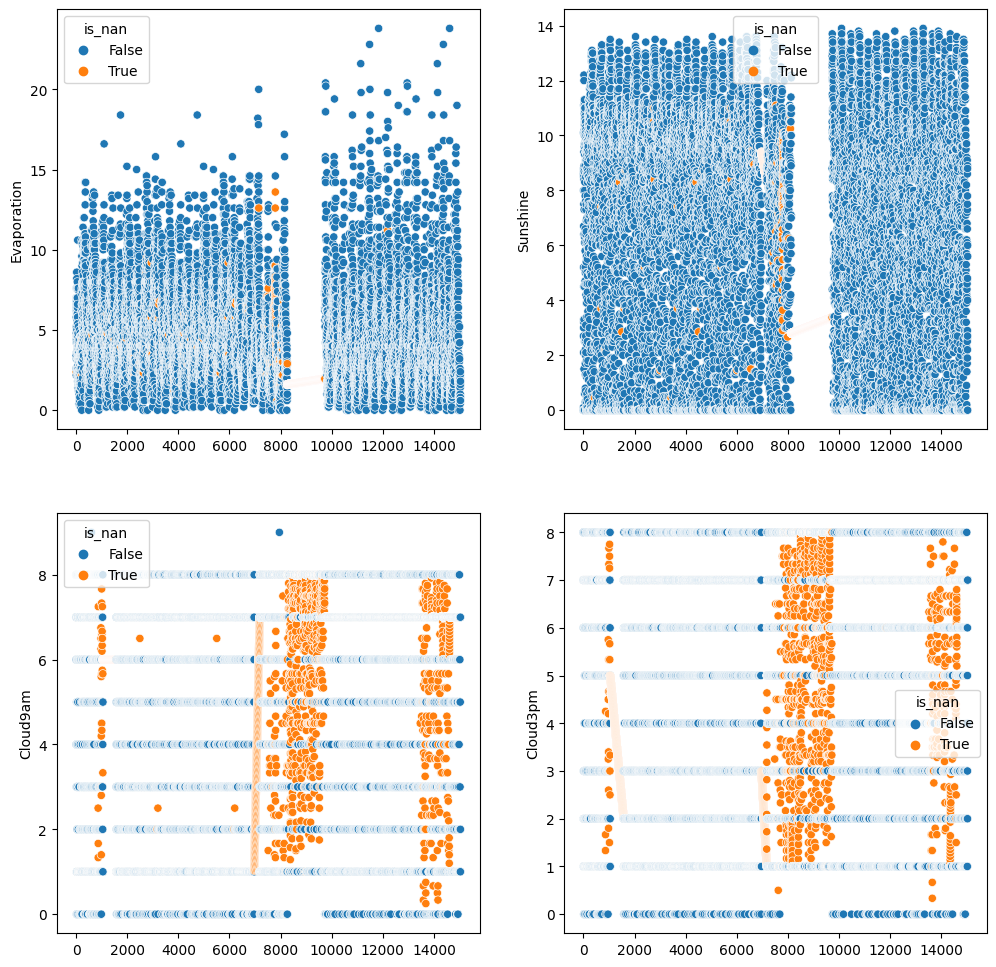

In [241]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]
plot_interpolated_scatter(cols, data, method="cubicspline")
plot_interpolated_scatter(cols, data, method="polynomial", order=1)

### Conclusión de interpolaciones
Utilizaremos una interpolación lineal para las variables 'MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am' y 'Temp3pm'.

Borraremos las filas nulas para las variables 'Cloud9am' y 'Cloud3pm'.
       
Para Evaporation y Sunshine intentaremos posteriormente encontrar variables explicativas para estas para generar un modelo, e intentar predecir los valores nulos faltantes de la forma mas cercana posible.

In [242]:
linear_cols = ['MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
nearest_cols = ['Cloud9am', 'Cloud3pm']

for col in linear_cols:
    data[col].interpolate(method="linear", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")

for col in nearest_cols:
    data[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")


MinTemp valores nulos : 0
MaxTemp valores nulos : 0
WindSpeed9am valores nulos : 0
WindSpeed3pm valores nulos : 0
Humidity9am valores nulos : 0
Humidity3pm valores nulos : 0
Pressure9am valores nulos : 0
Pressure3pm valores nulos : 0
Temp9am valores nulos : 0
Temp3pm valores nulos : 0
Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


### Nota
Vemos que la interpolacion lineal no se completa exitosamente para "WindGustSpeed". Esto se debe a que la ultima row para esta columna está vacia, por lo que no puede crearse una relación entre el último dato registrado y la última row de esta columna.
<p>Graficamos nuevamente un heatmap para entender cómo quedó la distribución de valores nulos en el dataset después de la interpolación</p>

<Axes: >

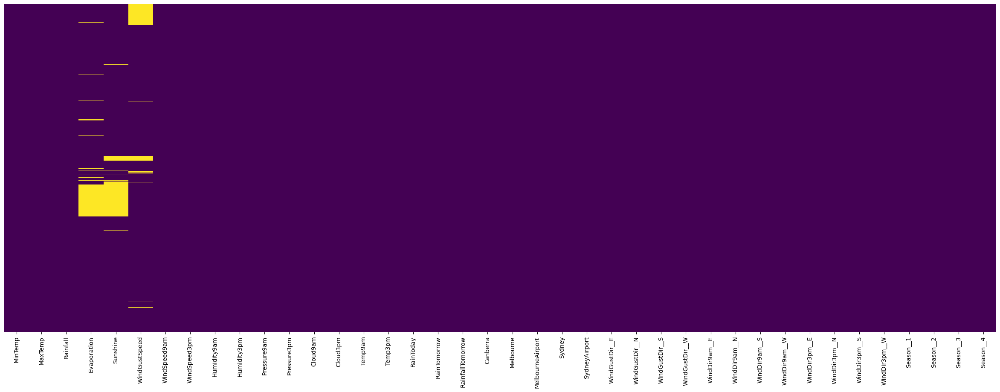

In [243]:
fig, ax = plt.subplots(figsize=(30, 10))
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False,)

Normalizaremos los datos y crearemos una matriz de correlación para tratar de entender la importancia y el peso de las mismas.
Se puede asumir que todavia las variables que tienen valores nulos son variables explicativas importantes para el modelo.

Sunshine ( luminocidad ): probablemente muy relacionado a la evaporación, la temperatura, la nubosidad y la presión.
Evaporation ( Evaporacion): se asume que tiene las mismas relaciones fuertes al igual sunshine.
WindGustSpeed( Rafagas de viento ): Probablemente muy relacionada a la presión.

Graficaremos una matriz de correlación para ver si se puede crear un modelo de regresión para predecir la mayor cantidad de valores para estas variables.

## Normalizar variables numéricas
Normalizamos las variables numéricas ya que se encuentran todas en diferentes escalas

In [244]:
from sklearn.preprocessing import StandardScaler

categorical_vars = [ 'RainTomorrow', 'RainToday','Canberra', 'Melbourne', 'MelbourneAirport',
       'Sydney', 'SydneyAirport', 'WindGustDir__E', 'WindGustDir__N',
       'WindGustDir__S', 'WindGustDir__W', 'WindDir3pm__E', 'WindDir3pm__N',
       'WindDir3pm__S', 'WindDir3pm__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W',
       'Month__1', 'Month__2', 'Month__3',
       'Month__4', 'Month__5', 'Month__6', 'Month__7', 'Month__8', 'Month__9',
       'Month__10', 'Month__11', 'Month__12', 'Season__1', 'Season__2',
       'Season__3', 'Season__4'
]

numerical_vars = [ col for col in data.columns if col not in categorical_vars ]

scale= StandardScaler() 
scaled_data = data.copy()

scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

## Matriz de correlación

<Axes: >

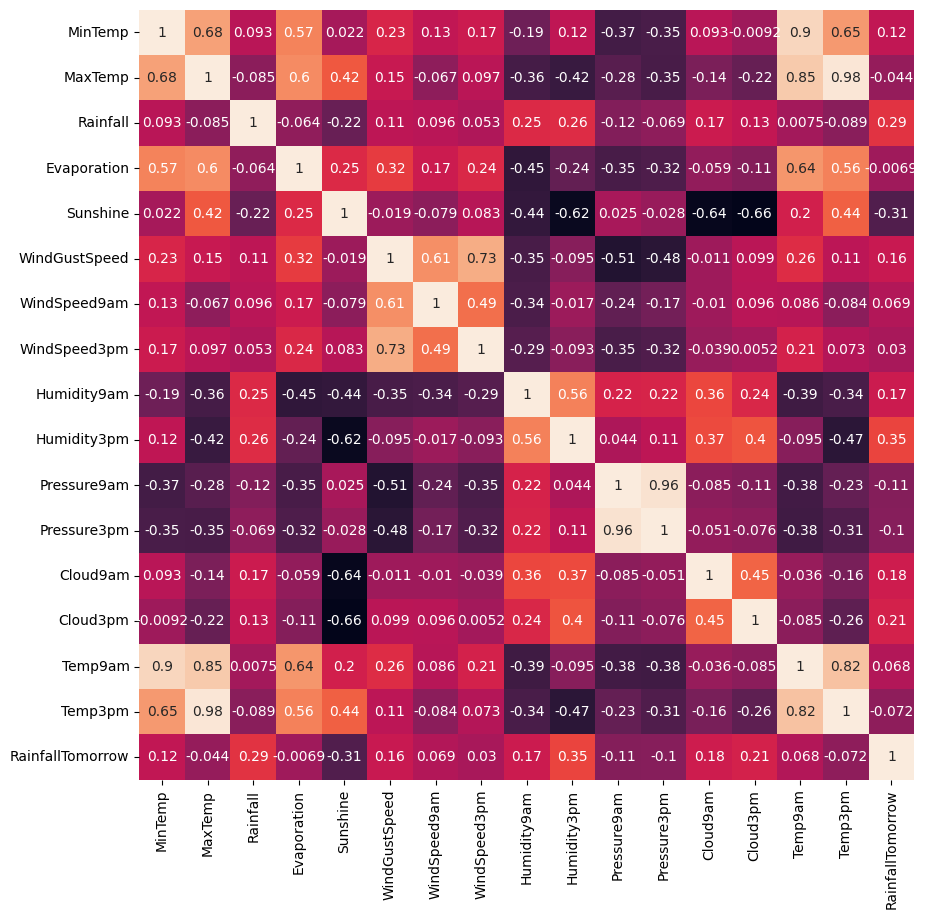

In [245]:
heatmap_data = scaled_data[numerical_vars]

plt.figure(figsize=(10, 10))
sbn.heatmap(heatmap_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

Concluimos que se cumple nuestra predicción anterior acerca de la correlaciones que se encuentran entre las distintas variables.
<p>Por ejemplo que Sunshine tiene una buena correlación con los dias nublados, la humedad y la temperatura.</p>
<p>Se intentera calcular los valores nulos para WindGustSpeed utilizando un modelo de regresion.</p>

<Axes: >

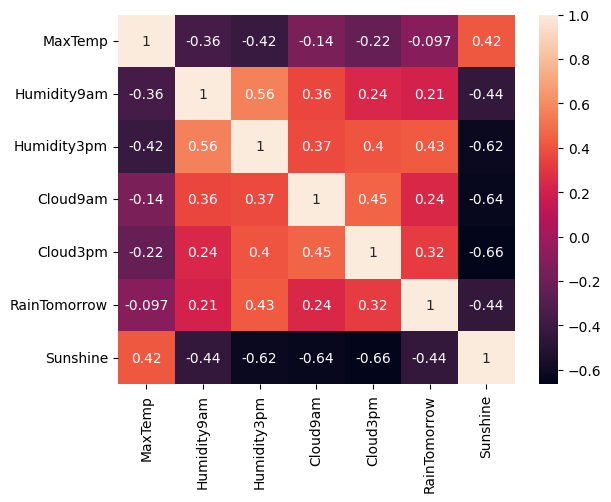

In [246]:
x_train_cols = ["MaxTemp", "Humidity9am", "Humidity3pm", "Cloud9am", "Cloud3pm","RainTomorrow"]

sunshine_data = data[ x_train_cols + ["Sunshine"] ] 
plt.figure()
sbn.heatmap(sunshine_data.corr(numeric_only=True, method='pearson'), yticklabels=True, annot=True)


Vemos que la correlación entre las variables y Sunshine siguen siendo buenas. Por lo que intentaremos predecir los valores nulos utilizando una regresión lineal.

0.7144771185811578 4.327911177187603
-0.686124481237373 24.43964727457699


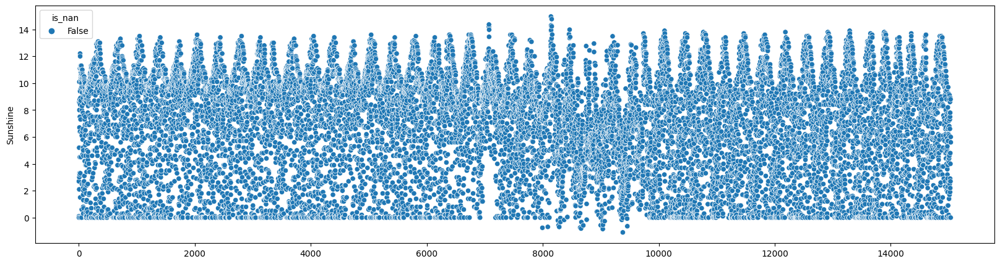

In [247]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, classification_report

sunshine_data_null =  sunshine_data[sunshine_data["Sunshine"].isnull()]
sunshine_data_not_null = sunshine_data[sunshine_data["Sunshine"].notnull()] 

x_pred = sunshine_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(sunshine_data_not_null[x_train_cols], sunshine_data_not_null["Sunshine"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Sunshine"] = y_pred
data["Sunshine"].update(x_pred["Sunshine"])

plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5), sy=1)

### Interpolar Sunshine con regresion lineal
Como podemos ver ahora se ajustan mucho mejor los valores para esta variable. Ahora acotaremos los valores entre 0 y 12 para mejorar los datos.

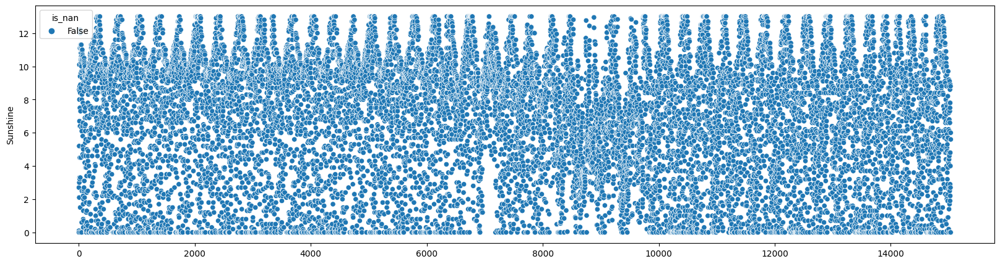

In [248]:
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value >0 else 0 )
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value <=13 else 13 )
plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5),sy=1)

### Regresión e Interpolar Evaporation
Realizamos la creacion de un modelo de regresion lineal para predecir los valores null de Evaporation

0.5797687017525566 4.0351645435450045
-0.829451922031025 17.490268756048312


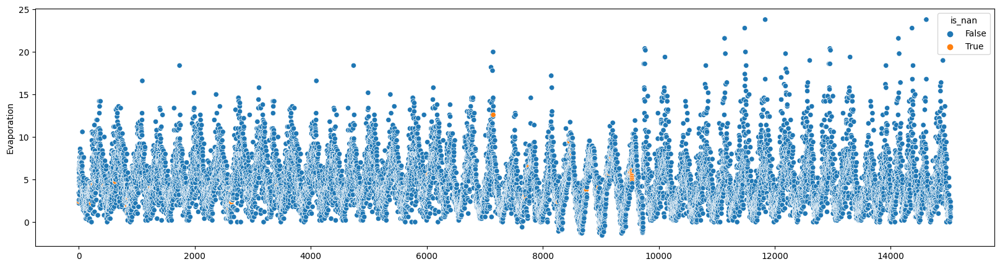

In [249]:
x_train_cols = [ c for c in data.columns if c != "Evaporation" ]

evaporation_data = data[ x_train_cols + ["Evaporation"] ] 
evaporation_data = evaporation_data[ 
    evaporation_data["WindGustSpeed"].notnull()
]

evaporation_data_null =  evaporation_data[evaporation_data["Evaporation"].isnull()]
evaporation_data_not_null = evaporation_data[evaporation_data["Evaporation"].notnull()] 

x_pred =evaporation_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(evaporation_data_not_null[x_train_cols], evaporation_data_not_null["Evaporation"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Evaporation"] = y_pred
data["Evaporation"].update(x_pred["Evaporation"])
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5), sy=1)

### Interpolamos Evaporation
<p> Se probaron varias formas de generar un modelo que se ajuste lo mejor posible para predecir los valores faltantes para la evaporación.</p>
<p> Se concluye heurísticamente que la mejor aproximacion parece ser utilizando el dataset completo. </p>
<p> Quedan algunos valores nulos que no pudieron ser interpolados y agregados al dataset pero vemos que se ajustan bien aplicando una interpolación lineal con el resto de los datos.</p>
<p> Vemos en el grafico que los datos se interpolan de forma mas prolija que todas las estimaciones anteriores usando lo metodos de interpolacion estandar provisto por la libreia Pandas. </p>
<p> Para los valores menores a 0 se restarán la distancia del minimo valor, para moverlos sobre 0 y simular un comportamiento mas parecido a la realidad </p>

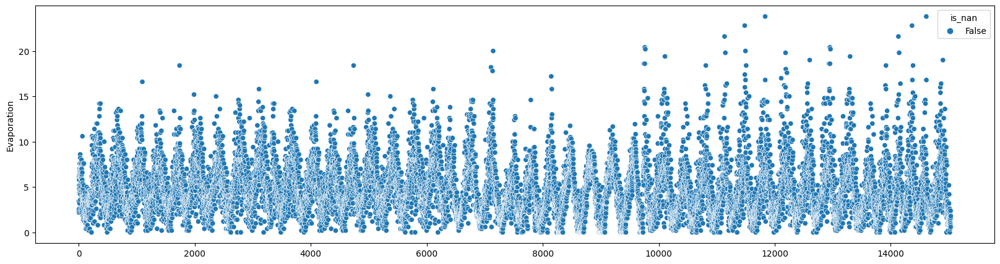

In [250]:
data["Evaporation"].interpolate(method="linear", inplace=True)
data["Evaporation"] = data["Evaporation"].apply(lambda value: 0 if value < 0 else value  )
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5),sy=1)

# Interpolar WindGust
Se replica exactamente el mismo procedimiento que para la estimación de Evaporation y Sunshine.

0.7225328164839133 61.64026669350834
-0.8584623317108142 421.34318675956007


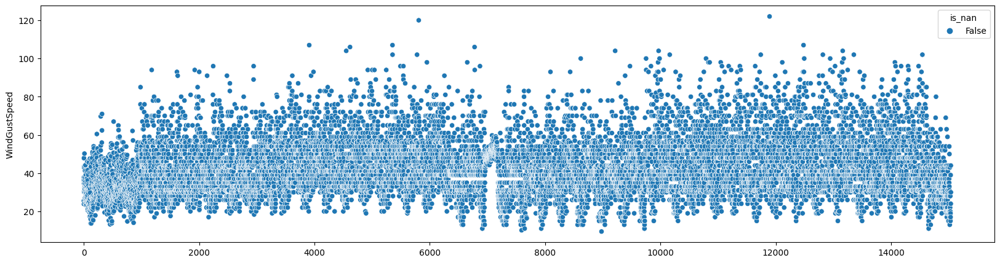

In [251]:
x_train_cols = [ c for c in data.columns if c != "WindGustSpeed" ]

windgust_data = data.copy()

windgust_data_null =  windgust_data[windgust_data["WindGustSpeed"].isnull()]
windgust_data_not_null = windgust_data[windgust_data["WindGustSpeed"].notnull()] 

x_pred = windgust_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(windgust_data_not_null[x_train_cols], windgust_data_not_null["WindGustSpeed"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["WindGustSpeed"] = y_pred
data["WindGustSpeed"].update(x_pred["WindGustSpeed"])
plot_interpolated_scatter(["WindGustSpeed"], data, method="polynomial",fsize=(20,5), sy=1, order=1)

# Escalar nuevamente los datos del dataset para toda las variables numéricas
Volvemos a escalar con nuestros datos nulos ya completos.

In [252]:
scaled_data = data.copy()
scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

### Graficar la matriz de correlación final escalada sin valores nulos

<Axes: >

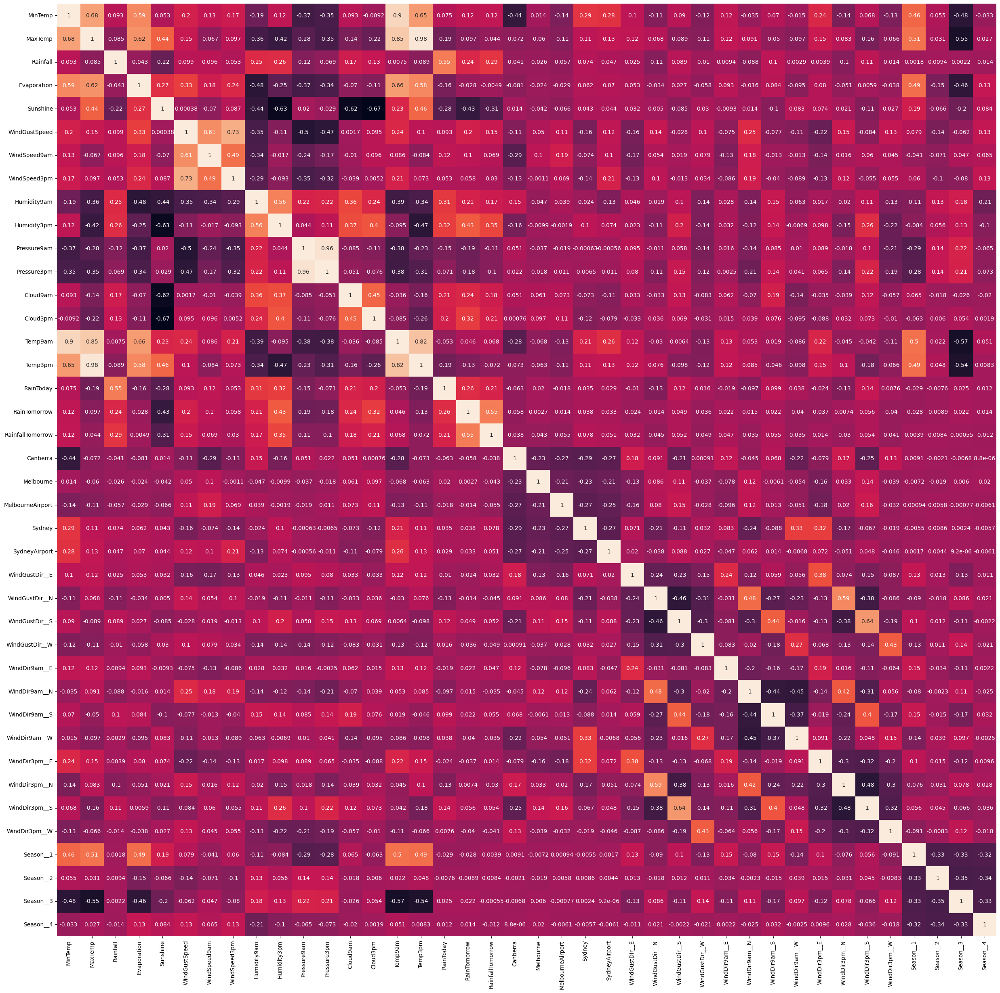

In [253]:
plt.figure(figsize=(30, 30))
sbn.heatmap(scaled_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

### Regresión Lineal Simple

In [254]:
x = scaled_data.copy()
y = x["RainfallTomorrow"].copy()
x.drop("RainfallTomorrow", axis=1, inplace=True)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


r2 = r2_score( y_test, y_pred)
m_e2 = mean_squared_error( y_test, y_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 


score R2: 0.3512
error MSE: 0.6998


# Regresión Lineal sin tratamientos de los datos
Aplicaremos una regresión lineal borrando todos los datos despues de realizar el encoding de las variables y sin interpolar ningun dato.

In [255]:
full_data_encoded.dropna(inplace=True)
full_data_encoded[numerical_vars] = scale.fit_transform(full_data_encoded[numerical_vars])

fx = full_data_encoded.copy()
fy = fx["RainfallTomorrow"].copy()
fx.drop("RainfallTomorrow", axis=1, inplace=True)
fx_train, fx_test, fy_train, fy_test = train_test_split(fx, fy, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(fx_train, fy_train)
fy_pred = model.predict(fx_test)

r2 = r2_score( fy_test, fy_pred)
m_e2 = mean_squared_error( fy_test, fy_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 

score R2: 0.4012
error MSE: 0.4243


## Conclusión Regresion Lineal
<p>Se puede ver que a pesar del esfuerzo al completar y normalizar los datos, el modelo lineal no se ajusta bien para la predicción de RainfallTomorrow con un score de 0.35. </p>
<p>Tiene mejor score y un error mas bajo al realizar un drop directamente sobre los datos nulos, por lo que seguiremos usando este set de datos en vez del interpolado.</p>

# Regularización y Regresiones Lasso, Ridge y ElasticNet 

In [256]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

lr = LinearRegression()
lr.fit(fx, fy)

print("Coeficientes del modelo de regresión lineal:")
#print(lr.coef_)
print(lr.score(fx,fy))

for alpha, ratio in [(0.9,0.2), (0.6,0.5), (0.3,0.5), (0.2,0.5), (0.1,0.3),
                     (0.01,0.9), (0.001,0.7), (0.0001,0.2), (0.00001,0.5), (0.000001,0.9)]:
    lasso = Lasso(alpha=0.1)
    ridge = Ridge(alpha=0.1) 
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=ratio)

    lasso.fit(fx, fy)
    ridge.fit(fx, fy)
    elasticnet.fit(fx,fy)


    print(f"\nAlpha: {alpha} Ratio {ratio}")
    #print(lasso.coef_)
    print(f"Lasso Coef: {round(lasso.score(fx,fy), 4)}")

    #print(ridge.coef_)
    print(f"Ridge Coef: {round(ridge.score(fx,fy), 4)}")

    #print(elasticnet.coef_)
    print(f"ElasticNet : {round(elasticnet.score(fx,fy), 4)}")

Coeficientes del modelo de regresión lineal:
0.3461322188219069

Alpha: 0.9 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0815

Alpha: 0.6 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0163

Alpha: 0.3 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.149

Alpha: 0.2 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2211

Alpha: 0.1 Ratio 0.3
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2973

Alpha: 0.01 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3383

Alpha: 0.001 Ratio 0.7
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3459


Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+00, tolerance: 1.067e+00



Alpha: 0.0001 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-05 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-06 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461


Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.036e+03, tolerance: 1.067e+00


# Regularizacion y Regresiones Lasso, Ridge y ElasticNet Cross Validation 

In [257]:
lassoCV = LassoCV() 
ridgeCV = RidgeCV() 
elasticnetCV = ElasticNetCV()

lassoCV.fit(fx, fy)
ridgeCV.fit(fx, fy)
elasticnetCV.fit(fx,fy)

print("lasso alpha:",lassoCV.alpha_)
print("ridge alpha:",ridgeCV.alpha_)
print("elastic net alpha:",elasticnetCV.alpha_ )

# Mostrar coeficientes
print("\nCoeficientes del modelo Lasso:")
#print(lassoCV.coef_)
print(round(lassoCV.score(fx,fy), 4))

print("\nCoeficientes del modelo Ridge:")
#print(ridgeCV.coef_)
print(round(ridgeCV.score(fx,fy), 4))


print("\nCoeficientes del modelo ElasticNet:")
#print(elasticnetCV.coef_)
print(round(elasticnetCV.score(fx,fy), 4))

lasso alpha: 0.0011696690144337191
ridge alpha: 10.0
elastic net alpha: 0.0007144000326480332

Coeficientes del modelo Lasso:
0.3456

Coeficientes del modelo Ridge:
0.3461

Coeficientes del modelo ElasticNet:
0.346


## Analizar variables para clasificación
El propósito es ver qué variables nos permiten diferenciar correctamente si llueve o no.
Dado que ya realizamos un análisis previo de las variables para la regresión lineal no hay mucho análisis para agregar ya que la variable RainfallTomorrow explica la columna RainTomorrow

In [258]:
dfclas = data.copy()

<Figure size 640x480 with 0 Axes>

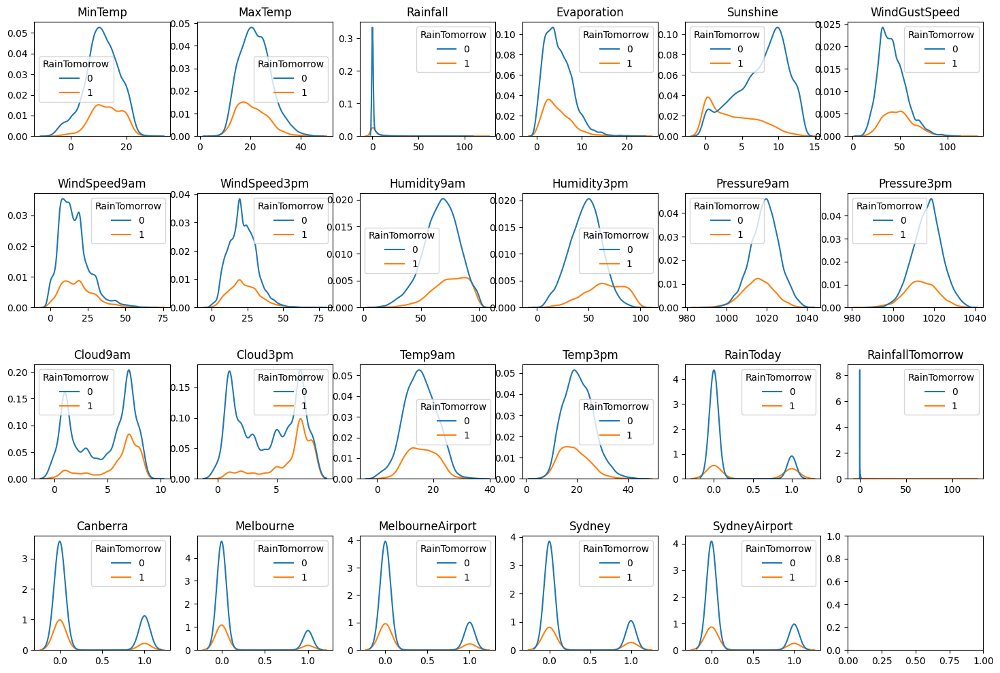

In [259]:
cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainfallTomorrow',
       'Canberra', 'Melbourne', 'MelbourneAirport', 'Sydney', 'SydneyAirport']
filas = 4
columnas = 6
plt.figure()
fig, axs = plt.subplots(filas, columnas, figsize=(18, 12))
fig.subplots_adjust(hspace=0.5)
for i, columna in enumerate(cols):
    f = i // columnas
    c = i % columnas
    sbn.kdeplot(dfclas, x=columna, hue="RainTomorrow", ax=axs[f, c])
    axs[f, c].set_title(columna)
    axs[f, c].set_xlabel('')
    axs[f, c].set_ylabel('')
plt.show()

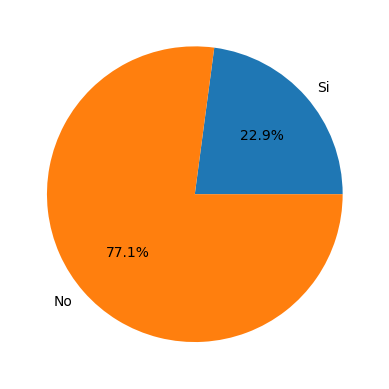

In [260]:
tot_no = data["RainTomorrow"].value_counts()[0]
tot_si = data["RainTomorrow"].value_counts()[1]
porcentaje_si = round(tot_si / (tot_no + tot_si) * 100, 2)
porcentaje_no = round(tot_no / (tot_no + tot_si) * 100, 2)
data_cantidad = pd.DataFrame(columns=["RainTomorrow", "%"], index=["Si", "No", "Total"], data=[
    [tot_si, porcentaje_si],
    [tot_no, porcentaje_no],
    [tot_si + tot_no, porcentaje_si + porcentaje_no]
])

plt.figure()
plt.pie([tot_si, tot_no], labels=["Si", "No"], autopct='%1.1f%%')
plt.show()

In [261]:
data_cantidad

,RainTomorrow,%
Si,3443,22.9
No,11593,77.1
Total,15036,100.0


Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

## Pesos de clase

In [262]:
logmodel = LogisticRegression(class_weight="balanced", random_state=42, max_iter=1000)

In [263]:
dflogx = full_data_encoded.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [264]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[2410   22]
 [   9  760]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2432
           1       0.97      0.99      0.98       769

    accuracy                           0.99      3201
   macro avg       0.98      0.99      0.99      3201
weighted avg       0.99      0.99      0.99      3201



In [265]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,2410,22
Real Positivo,9,760


## Submuestreo
Para el submuestreo vamos a crear una función que elimine aleatoriamente registros de una clase para así poder equilibrar el dataframe

In [266]:
def submuestreo(df: pd.DataFrame, columna: str):
    clases = df[columna].unique()
    clases_count = df[columna].value_counts()
    #Encontrar clase con menor frecuencia
    clase_menor = clases_count.idxmin()
    #Iterar y seleccionar aleatoriamente un nro igual de muestras de cada clase
    clase_menor_count = clases_count[clase_menor]
    data_generada = pd.DataFrame(columns=df.columns)
    dataframes = []
    for clase_target in clases:
        clase_data = df[df[columna] == clase_target]
        if clase_target != clase_menor:
            dataframes.append(clase_data.sample(clase_menor_count, replace=False))
        else:
            dataframes.append(clase_data)
    data_generada = pd.concat(dataframes)
    return data_generada

In [267]:
full_data_encoded["RainTomorrow"].value_counts()

RainTomorrow
0    8176
1    2494
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x7ff8cd8a43a0>,
 [Text(6.735557395310444e-17, 1.1, 'Si'),
  Text(-2.0206672185931328e-16, -1.1, 'No')],
 [Text(3.6739403974420595e-17, 0.6, '50.0%'),
  Text(-1.1021821192326178e-16, -0.6, '50.0%')])

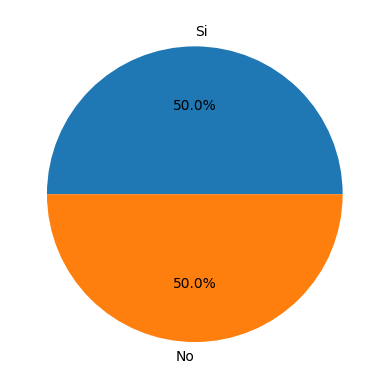

In [268]:
dfsub = submuestreo(full_data_encoded, "RainTomorrow")
plt.pie(dfsub["RainTomorrow"].value_counts(), labels=["Si", "No"], autopct='%1.1f%%')

In [269]:
logmodel = LogisticRegression(random_state=42)
dflogx = dfsub.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


LogisticRegression(random_state=42)

In [270]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[761   6]
 [ 19 711]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       767
           1       0.99      0.97      0.98       730

    accuracy                           0.98      1497
   macro avg       0.98      0.98      0.98      1497
weighted avg       0.98      0.98      0.98      1497



In [271]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,761,6
Real Positivo,19,711


## SMOTE
Esta librería realiza los siguientes pasos para equilibrar el dataset
1. Para cada fila de la clase minoritaria, se identifican sus k vecinos más cercanos
2. Se selecciona aleatoriamente uno de los vecinos cercanos y se lo etiqueta como *Vecino Cercano*
3. Se elige un valor aleatorio entre 0 y 1, luego multiplica la diferencia entre la instancia actual y el *Vecino Cercano* por el valor aleatorio. Este resultado se suma a la instancia actual para crear una nueva con diferentes datos

In [272]:
dfsx = dfsub.copy()
dfsy = dfsx["RainTomorrow"].copy()
dfsx.drop("RainTomorrow", axis=1, inplace=True)
smote = SMOTE(random_state=42)
xsmote, ysmote = smote.fit_resample(dfsx, dfsy)
X_train, X_test, y_train, y_test = train_test_split(xsmote, ysmote, test_size=0.3, random_state=42)

In [273]:
logmodel = LogisticRegression(random_state=42, max_iter=1000)
logmodel.fit(X_train, y_train)
logpredict = logmodel.predict(X_test)

In [274]:
print(confusion_matrix(y_test, logpredict))
print(classification_report(y_test, logpredict))

[[761   6]
 [ 19 711]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       767
           1       0.99      0.97      0.98       730

    accuracy                           0.98      1497
   macro avg       0.98      0.98      0.98      1497
weighted avg       0.98      0.98      0.98      1497



In [275]:
confusion_matrix_smote = pd.DataFrame(confusion_matrix(y_test, logpredict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
confusion_matrix_smote

,Negativo Predicho,Positivo Predicho
Real Negativo,761,6
Real Positivo,19,711


## Conclusión
Vemos que cualquiera de los tres métodos son útiles ya que en todos obtenemos *precision*, *recall* y *f1-score* de 0.99 y 0.98. Además, en todas las matrices de confusión podemos ver que hay muchos Negativos Positivos y Reales Positivos

## Redes neuronales con Tensorflow

In [276]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import clone_model
import os
import optuna
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

#### Crear modelo para clasificación (Llueve / No llueve)

In [277]:
def objetivo_clas(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
    score = model.evaluate(X_test, y_test, verbose=0)
    return score[1]

Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [278]:
estudio = optuna.create_study(direction="maximize")
estudio.optimize(objetivo_clas, n_trials=1)

[I 2023-12-06 17:05:36,821] A new study created in memory with name: no-name-75f3d7c9-c3cb-491d-a13f-352c56a7e656


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3469 - accuracy: 0.8427 - val_loss: 0.1915 - val_accuracy: 0.9272
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1371 - accuracy: 0.9464 - val_loss: 0.2632 - val_accuracy: 0.8878
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0760 - accuracy: 0.9734 - val_loss: 0.0754 - val_accuracy: 0.9706
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0348 - accuracy: 0.9871 - val_loss: 0.0604 - val_accuracy: 0.9746
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0261 - accuracy: 0.9911 - val_loss: 0.0490 - val_accuracy: 0.9786
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0348 - accuracy: 0.9880 - val_loss: 0.0439 - val_accuracy: 0.9826
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0380 - accuracy: 0.9857 - val_loss: 0.0558 - val_accuracy: 0.9780

[I 2023-12-06 17:05:58,141] Trial 0 finished with value: 0.9826319217681885 and parameters: {'num_layers': 3, 'n_units_layer_0': 159, 'n_units_layer_1': 145, 'n_units_layer_2': 111}. Best is trial 0 with value: 0.9826319217681885.


In [279]:
estudio.best_params

{'num_layers': 3,
 'n_units_layer_0': 159,
 'n_units_layer_1': 145,
 'n_units_layer_2': 111}

In [280]:
estudio.best_value

0.9826319217681885

Los mejores parámetros:
* num_layers: 3
* Neuronas en capa 1: 71
* Neuronas en capa 2: 16
* Neuronas en capa 3: 56
<br>
Score: 0.99

## Creación del modelo

In [281]:
model_reg = Sequential()
model_reg.add(Input(shape=[dfsx.shape[1], ]))
model_reg.add(Dense(71, activation="relu"))
model_reg.add(Dense(16, activation="relu"))
model_reg.add(Dense(56, activation="relu"))
model_reg.add(Dense(1, activation="sigmoid"))
model_reg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
history = model_reg.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.4669 - accuracy: 0.7897 - val_loss: 0.3483 - val_accuracy: 0.8597
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2630 - accuracy: 0.8874 - val_loss: 0.2187 - val_accuracy: 0.9145
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1538 - accuracy: 0.9453 - val_loss: 0.1355 - val_accuracy: 0.9452
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0842 - accuracy: 0.9693 - val_loss: 0.0960 - val_accuracy: 0.9606
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0580 - accuracy: 0.9788 - val_loss: 0.0848 - val_accuracy: 0.9599
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0356 - accuracy: 0.9885 - val_loss: 0.0533 - val_accuracy: 0.9719
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0253 - accuracy: 0.9926 - val_loss: 0.0450 - val_accuracy: 0.9793

In [282]:
model_reg.evaluate(X_test, y_test)

47/47 [==============================] - 0s 5ms/step - loss: 0.0469 - accuracy: 0.9793


[0.046913906931877136, 0.9792919158935547]

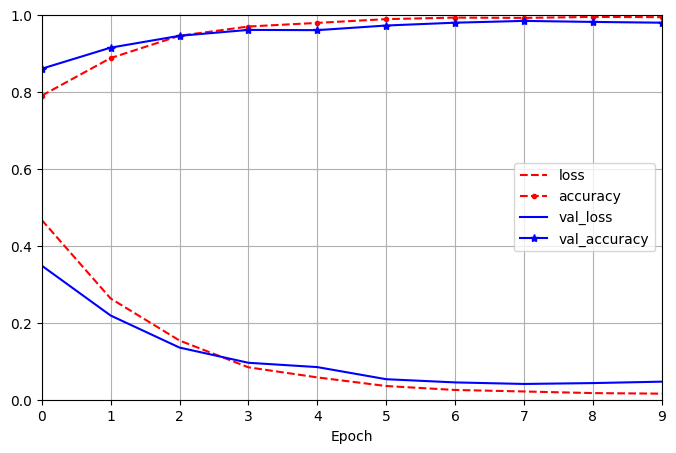

In [283]:
pd.DataFrame(history.history).plot(figsize=(8, 5), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Se puede ver en el gráfico que, en las épocas finales, *accuracy* y *val_accuracy* están casi encima de la otra lo que indicaría que no hay un overfitting. Viendo el gráfico se puede decir que la precisión converge a uno y la pérdida a cero.

#### Creación de modelo para regresión

In [284]:
def objetivo_reg(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1))
    model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
    model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)
    score = model.evaluate(fx_test, fy_test, verbose=0)
    return score[1]

In [285]:
estudio_reg = optuna.create_study(direction="maximize")
estudio_reg.optimize(objetivo_reg, n_trials=1)

[I 2023-12-06 17:06:19,790] A new study created in memory with name: no-name-162b7e6b-72b2-44f7-8453-87462ca83d89


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8103 - rmse: 0.9002 - val_loss: 0.3751 - val_rmse: 0.6124
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6851 - rmse: 0.8277 - val_loss: 0.3458 - val_rmse: 0.5881
Epoch 3/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6263 - rmse: 0.7914 - val_loss: 0.3692 - val_rmse: 0.6076
Epoch 4/10
234/234 [==============================] - 5s 20ms/step - loss: 0.5799 - rmse: 0.7615 - val_loss: 0.4757 - val_rmse: 0.6897
Epoch 5/10
234/234 [==============================] - 5s 20ms/step - loss: 0.5271 - rmse: 0.7260 - val_loss: 0.4591 - val_rmse: 0.6776
Epoch 6/10
234/234 [==============================] - 5s 20ms/step - loss: 0.5076 - rmse: 0.7124 - val_loss: 0.4159 - val_rmse: 0.6449
Epoch 7/10
234/234 [==============================] - 5s 20ms/step - loss: 0.4709 - rmse: 0.6862 - val_loss: 0.5293 - val_rmse: 0.7275
Epoch 8/10
234/234 [==============================] - 5

[I 2023-12-06 17:07:08,540] Trial 0 finished with value: 0.6461255550384521 and parameters: {'num_layers': 4, 'n_units_layer0': 142, 'n_units_layer1': 199, 'n_units_layer2': 95, 'n_units_layer3': 8}. Best is trial 0 with value: 0.6461255550384521.


In [286]:
estudio_reg.best_params

{'num_layers': 4,
 'n_units_layer0': 142,
 'n_units_layer1': 199,
 'n_units_layer2': 95,
 'n_units_layer3': 8}

In [287]:
estudio_reg.best_value

0.6461255550384521

Luego de haber realizado distintas pruebas utilizando optula se encontró que los mejores parámetros son:
* Número de capas: 4
* Neuronas en capa 1: 152
* Neuronas en capa 2: 143
* Neuronas en capa 3: 118
* Neuronas en capa 4: 135
<br>
Score: 0.92

#### Creación del modelo

In [288]:
modelo_reg = Sequential()
modelo_reg.add(Input(shape=[fx_train.shape[1], ]))
modelo_reg.add(Dense(152, activation="relu"))
modelo_reg.add(Dense(143, activation="relu"))
modelo_reg.add(Dense(118, activation="relu"))
modelo_reg.add(Dense(135, activation="relu"))
modelo_reg.add(Dense(1))
modelo_reg.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
history_reg = modelo_reg.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)

Epoch 1/10
234/234 [==============================] - 5s 20ms/step - loss: 0.7990 - rmse: 0.8939 - val_loss: 0.3695 - val_rmse: 0.6079
Epoch 2/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6870 - rmse: 0.8288 - val_loss: 0.3738 - val_rmse: 0.6114
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6317 - rmse: 0.7948 - val_loss: 0.4383 - val_rmse: 0.6621
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5840 - rmse: 0.7642 - val_loss: 0.4220 - val_rmse: 0.6496
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5508 - rmse: 0.7422 - val_loss: 0.3996 - val_rmse: 0.6321
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5088 - rmse: 0.7133 - val_loss: 0.5227 - val_rmse: 0.7230
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4541 - rmse: 0.6738 - val_loss: 0.4238 - val_rmse: 0.6510
Epoch 8/10
234/234 [==============================] - 5

In [289]:
modelo_reg.evaluate(fx_test, fy_test)

101/101 [==============================] - 1s 5ms/step - loss: 0.4433 - rmse: 0.6658


[0.4433160126209259, 0.6658198237419128]

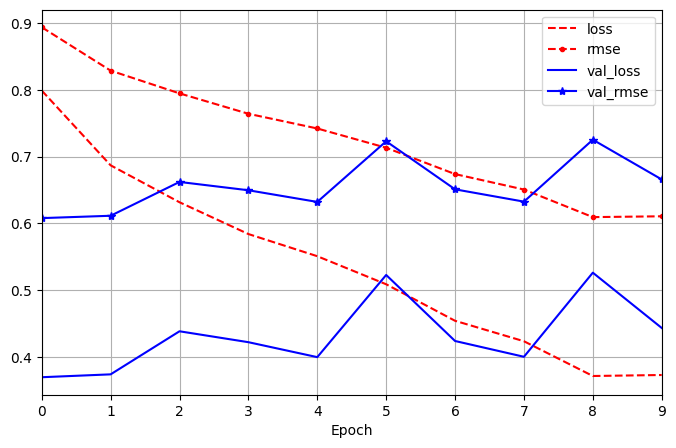

In [290]:
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9],  grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Analizando el gráfico, podemos ver que la métrica RMSE de training está muy por encima del RMSE de testing y lo mismo sucede con la pérdida, por lo tanto contamos con overfitting. Además, no vemos que el modelo mejore a lo largo de las iteraciones

### SHAP - Explicabilidad de modelo

In [291]:
import shap
shap.initjs()

#### Regresión Logística - Clasificación

In [292]:
explainer_log = shap.Explainer(logmodel, X_train.values, feature_names=X_train.columns)
shap_log = explainer_log.shap_values(X_test.values)
shap_values_log = explainer_log(X_test.values)
index = 0
explanation_log = shap.Explanation(values=shap_log[index], base_values=explainer_log.expected_value, feature_names=X_train.columns)

### Explicación global - Modelo Regresión Logística

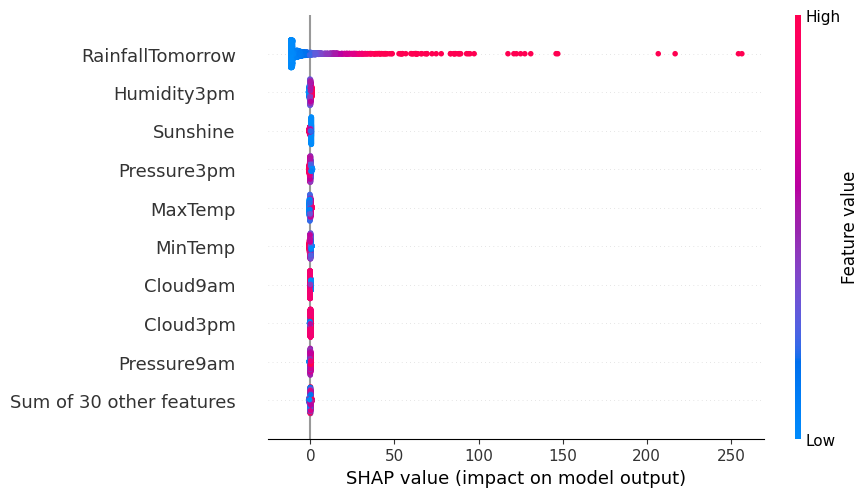

In [293]:
shap.plots.beeswarm(shap_values_log)

In [294]:
shap.plots.force(shap_values_log[0:100], feature_names=X_train.columns)

Podemos observar que la variable que más afecta en la decisión a nivel global del modelo de regresión logística es **RainfallTomorrow** lo cual tiene sentido ya que nos indica la cantidad de lluvia que cayó el día de mañana y si consideramos que nuestro modelo debe predecir si mañana llueve o no es una variable de suma importancia

### Explicación Local - Modelo Regresión Logística

<Figure size 640x480 with 0 Axes>

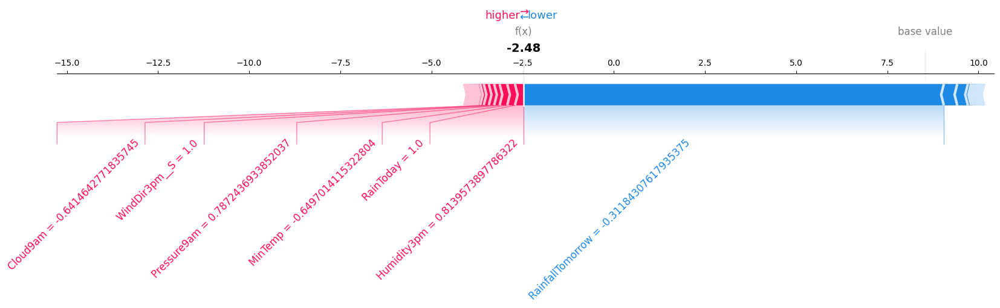

<Figure size 640x480 with 0 Axes>

In [295]:
plt.figure()
shap.force_plot(explainer_log.expected_value, explanation_log.values, X_test.values[index], text_rotation=45, feature_names=X_train.columns, matplotlib=True)
plt.tight_layout()

En el caso de este registro en particular, podemos ver el valor de la predicción promedio (base value) y cómo cada feature fue modificando ese valor hasta llegar a f(x)

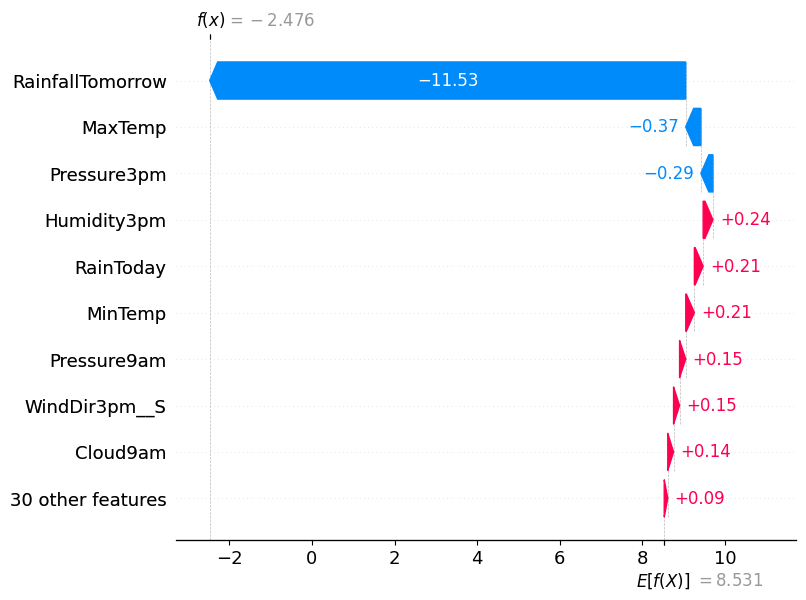

In [296]:
shap.plots.waterfall(explanation_log)

En este gráfico de cascada podemos observar lo mismo y ver cuantitativamente los cambios que realizaron cada feature

#### Regresión Lineal - Ridge

In [297]:
explainer_ridge = shap.LinearExplainer(ridgeCV, fx_train.values, feature_names=fx_train.columns)
shap_ridge = explainer_ridge.shap_values(fx_test.values)
shap_values_ridge = explainer_ridge(fx_test.values)
index = 0
explanation_ridge = shap.Explanation(values=shap_ridge[index], base_values=explainer_ridge.expected_value, feature_names=fx_train.columns)

### Explicación global - Modelo Regresión Lineal

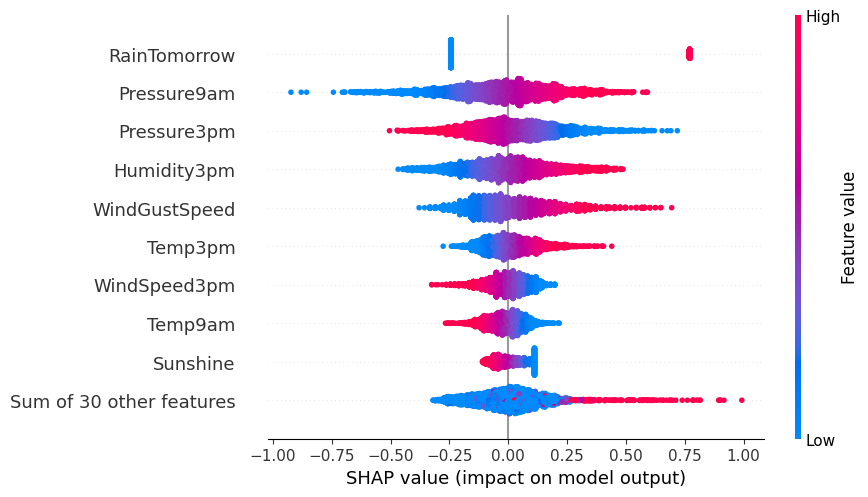

In [298]:
shap.plots.beeswarm(shap_values_ridge)

En este caso, a diferencia de la regresión logística, vemos que la influencia de las features están mas distribuidas

In [299]:
shap.plots.force(shap_values_ridge[0:100], feature_names=fx_train.columns)

En este otro gráfico podemos corroborar lo que vimos en el anterior anterior al observar que no hay ninguna variable que opaca toda la distribución

### Explicación Local - Modelo Regresión Lineal

<Figure size 640x480 with 0 Axes>

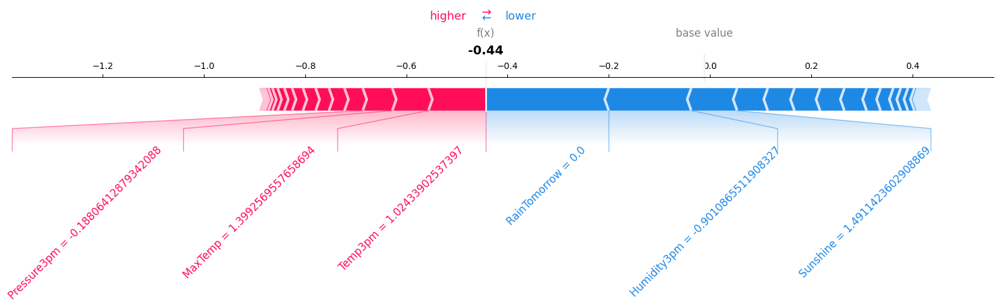

<Figure size 640x480 with 0 Axes>

In [300]:
plt.figure()
shap.force_plot(explainer_ridge.expected_value, explanation_ridge.values, fx_test.values[index], text_rotation=45, feature_names=fx_train.columns, matplotlib=True)
plt.tight_layout()

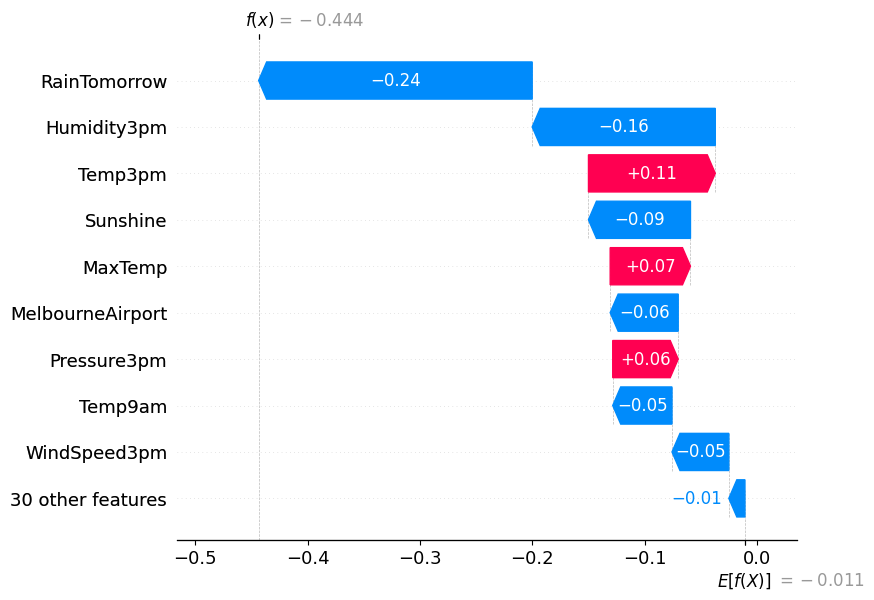

In [301]:
shap.plots.waterfall(explanation_ridge)

En los gráficos anteriores vemos cómo influye cada feature en una predicción particular. 

## Creacion del modelo utilizando Pipelines

In [310]:
pipeline = Pipeline([
    ("preprocessor", scale),
    ('custom_model',logmodel)
])

## Exportar Pipeline

In [307]:
import joblib
joblib.dump(pipeline, 'models/rain.pkl')

['models/rain.pkl']

# Conclusión
Durante este proyecto, exploramos y desarrollamos múltiples modelos para predecir la lluvia basándonos en diversas características. Comenzamos abordando la integridad de nuestros datos al completar los valores faltantes, asegurándonos de mantener la calidad de nuestro conjunto de datos para su análisis.

Para nuestros modelos de regresión, experimentamos con varios enfoques, incluyendo regresión lineal clásica, Ridge, Lasso y Elastic Net. Observamos cómo cada uno maneja la regularización y la complejidad del modelo, lo que nos permitió seleccionar el enfoque más adecuado para nuestro problema. Sin embargo, nunca logramos obtener un buen modelo de regresión.

Además, para lidiar con el desbalance en los datos, aplicamos técnicas de balanceo en nuestro conjunto de datos, lo que mejoró significativamente el rendimiento y la generalización de nuestros modelos.

Exploramos modelos más avanzados, incluyendo redes neuronales tanto para regresión como para clasificación, utilizando TensorFlow y Keras. Estos modelos demostraron una capacidad impresionante para capturar relaciones no lineales y patrones complejos en los datos, aunque requirieron una mayor complejidad de ajuste.

Analizamos los modelos con Shap para generar gráficos explicativos.

Finalmente, integramos todos nuestros modelos en una pipeline para una implementación más sencilla y usamos Streamlit para llevar nuestro proyecto a producción. Esta herramienta nos permitió crear una interfaz interactiva y amigable que ofrece nuestras predicciones a los usuarios finales.